In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
import plotly.graph_objs as go
import numpy as np
import plotly.offline as py
import plotly.graph_objs as go

In [2]:
df = pd.read_csv('zomato.csv')

In [66]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"[Pasta, Lunch Buffet, Masala Papad, Paneer ...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"[Momos, Lunch Buffet, Chocolate Nirvana, Th...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","[Churros, Cannelloni, Minestrone Soup, Hot ...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,[Masala Dosa],"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"[Panipuri, Gol Gappe]","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [4]:
df.duplicated().sum()

0

In [5]:
chains = df['name'].value_counts()[:15]
chains

name
Cafe Coffee Day      96
Onesta               85
Just Bake            73
Empire Restaurant    71
Five Star Chicken    70
Kanti Sweets         68
Petoo                66
Polar Bear           65
Baskin Robbins       64
Chef Baker's         62
Pizza Hut            62
Domino's Pizza       60
KFC                  60
Sweet Truth          60
Subway               60
Name: count, dtype: int64

## Lets look for top restaurant chain in Bangaluru.

<Axes: xlabel='count', ylabel='name'>

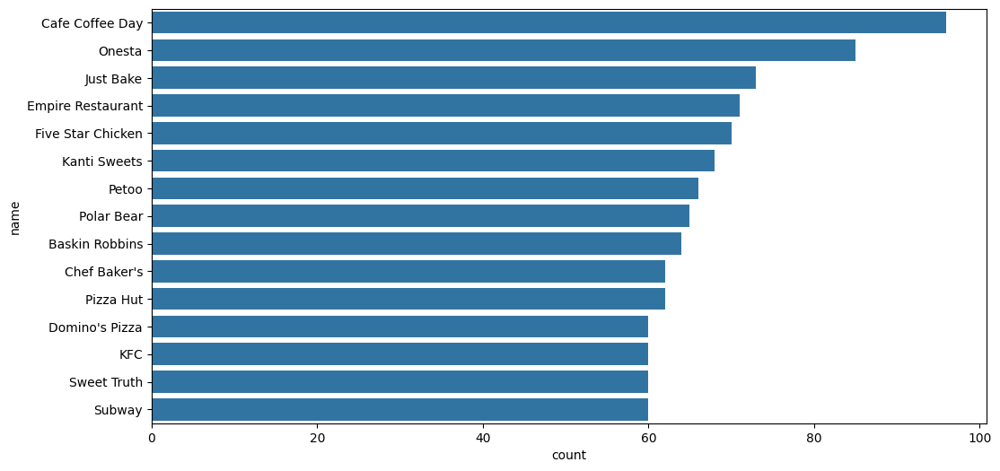

In [6]:
plt.figure(figsize=(12,6))
sns.barplot(x=chains, y=chains.index)

## Restuarants that do not accept online orders.

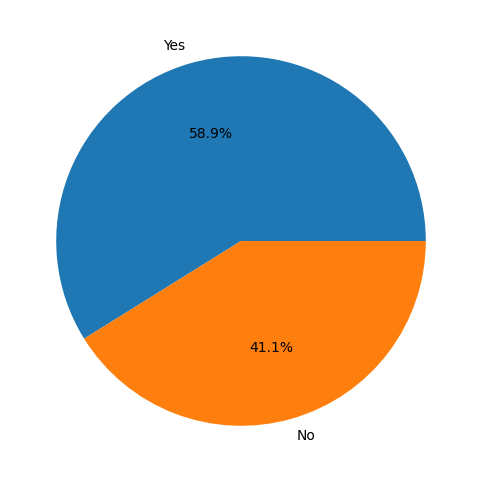

In [7]:
counts = df['online_order'].value_counts()
plt.figure(figsize=(8,6))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%')
plt.show()

## Restaurant that do and donot provide table booking.

In [8]:
table_booking = df['book_table'].value_counts()
table_booking

book_table
No     45268
Yes     6449
Name: count, dtype: int64

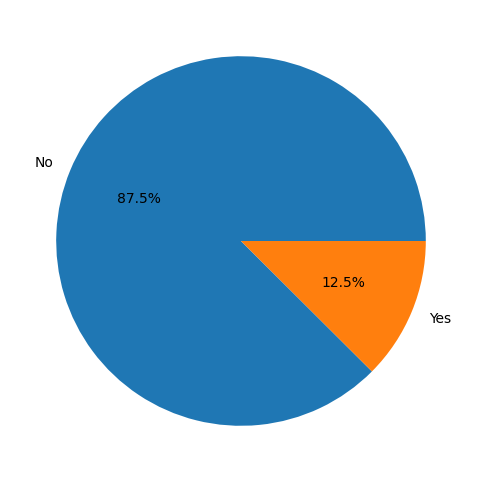

In [9]:
plt.figure(figsize=(8,6))
plt.pie(table_booking, labels=table_booking.index, autopct='%1.1f%%')
plt.show()

In [10]:
rating = df['rate'].dropna().value_counts()
rating

rate
NEW       2208
3.9/5     2098
3.8/5     2022
3.7/5     2011
3.9 /5    1874
          ... 
2.2 /5       7
2.0 /5       7
2.0/5        4
1.8 /5       3
1.8/5        2
Name: count, Length: 64, dtype: int64

In [11]:
plt.figure(figsize=(6,5))
rating=df['rate'].dropna().apply(lambda x : float(x.split('/')[0]) if (len(x)>3)  else np.nan ).dropna()
rating

0        4.1
1        4.1
2        3.8
3        3.7
4        3.8
        ... 
51709    3.7
51711    2.5
51712    3.6
51715    4.3
51716    3.4
Name: rate, Length: 41665, dtype: float64

<Figure size 600x500 with 0 Axes>

<Axes: xlabel='rate', ylabel='Count'>

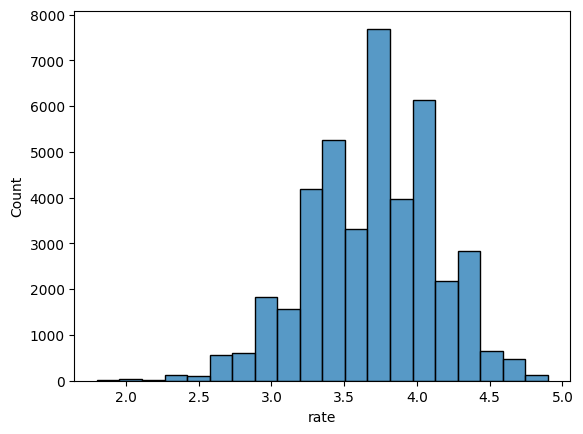

In [12]:
sns.histplot(rating, bins=20)

## Difference between restaurants votes that accept and not accept online order

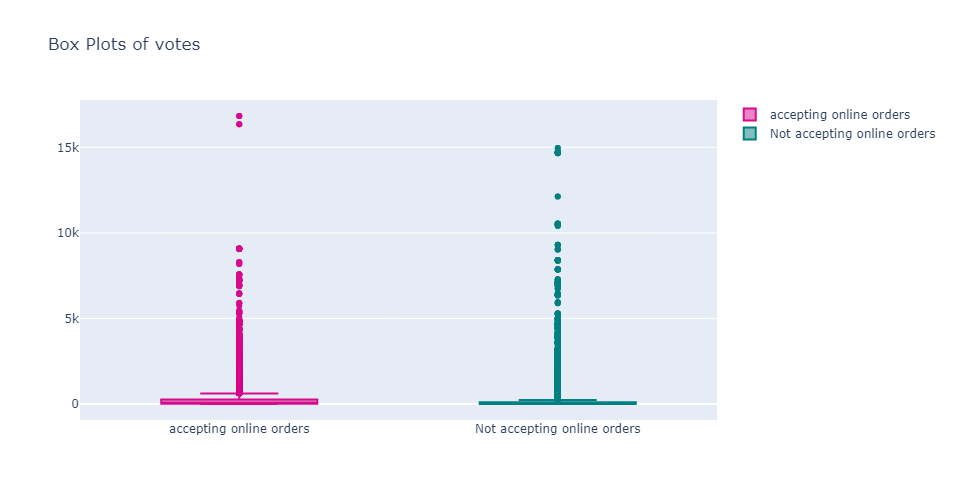

In [13]:
votes_yes=df[df['online_order']=="Yes"]['votes']
trace0=go.Box(y=votes_yes,name="accepting online orders",
              marker = dict(
        color = 'rgb(214, 12, 140)',
    ))

votes_no=df[df['online_order']=="No"]['votes']
trace1=go.Box(y=votes_no,name="Not accepting online orders",
              marker = dict(
        color = 'rgb(0, 128, 128)',
    ))

layout = go.Layout(
    title = "Box Plots of votes",width=800,height=500
)

data=[trace0,trace1]
fig=go.Figure(data=data,layout=layout)
py.iplot(fig)


In [14]:
data

[Box({
     'marker': {'color': 'rgb(214, 12, 140)'},
     'name': 'accepting online orders',
     'y': array([775, 787, 918, ..., 673, 548, 128], dtype=int64)
 }),
 Box({
     'marker': {'color': 'rgb(0, 128, 128)'},
     'name': 'Not accepting online orders',
     'y': array([ 88, 166,   8, ...,   0, 236,  13], dtype=int64)
 })]

## Common Restaurant type in Bangalore

In [15]:
restaurant_type = df['rest_type'].value_counts()[:20]
restaurant_type

rest_type
Quick Bites                   19132
Casual Dining                 10330
Cafe                           3732
Delivery                       2604
Dessert Parlor                 2263
Takeaway, Delivery             2037
Casual Dining, Bar             1154
Bakery                         1141
Beverage Shop                   867
Bar                             697
Food Court                      624
Sweet Shop                      468
Bar, Casual Dining              425
Lounge                          396
Pub                             357
Fine Dining                     346
Casual Dining, Cafe             319
Beverage Shop, Quick Bites      298
Bakery, Quick Bites             289
Mess                            267
Name: count, dtype: int64

<Axes: xlabel='count', ylabel='rest_type'>

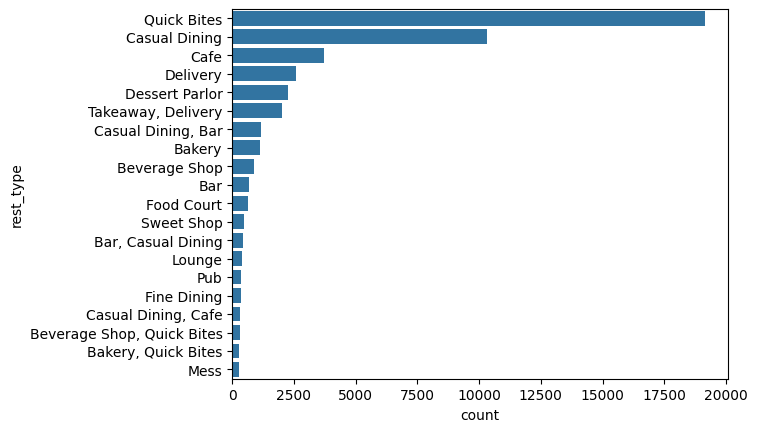

In [16]:
sns.barplot(x=restaurant_type, y=restaurant_type.index)

## Approx Cost for two people

In [17]:
price_count = df['approx_cost(for two people)'].value_counts()
price_count

approx_cost(for two people)
300      7576
400      6562
500      4980
200      4857
600      3714
         ... 
60          1
5,000       1
3,700       1
469         1
160         1
Name: count, Length: 70, dtype: int64

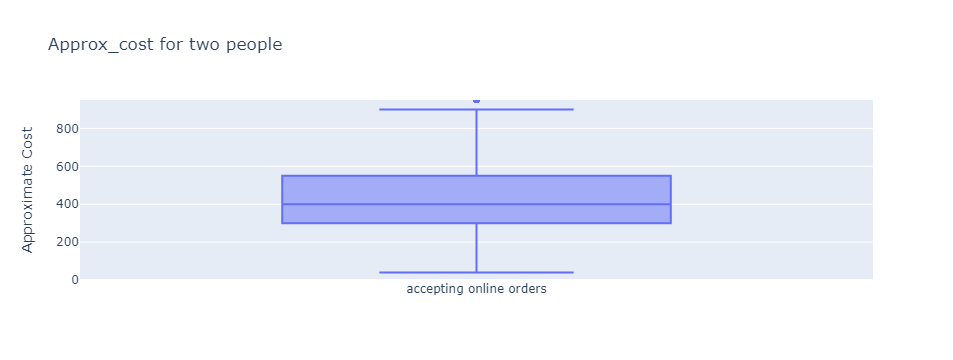

In [18]:
df['approx_cost(for two people)'] = pd.to_numeric(df['approx_cost(for two people)'], errors='coerce')
trace0=go.Box(y=df['approx_cost(for two people)'], name="accepting online orders")
data=[trace0]
layout=go.Layout(title='Approx_cost for two people', 
                yaxis = dict(title='Approximate Cost',range=[0, max(df['approx_cost(for two people)'])]))
fig=go.Figure(data=data, layout=layout)
py.iplot(fig)

## Most common cuisines in each location

In [19]:
df_1 = df.groupby(['location', 'cuisines']).agg('count')
data = df_1.sort_values(['url'],ascending=False).groupby(['location'], as_index=False).apply(lambda x: x.sort_values(by='url', ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})

In [20]:
data.head()

,level_0,location,cuisines,count
0,0,BTM,"North Indian, Chinese",379
1,0,BTM,North Indian,340
2,0,BTM,Biryani,120
3,1,Banashankari,South Indian,86
4,1,Banashankari,"North Indian, Chinese",61


## Most popular cuisines in bangalore

In [21]:
cuisine_count = df['cuisines'].value_counts()[:10]
cuisine_count

cuisines
North Indian                           2913
North Indian, Chinese                  2385
South Indian                           1828
Biryani                                 918
Bakery, Desserts                        911
Fast Food                               803
Desserts                                766
Cafe                                    756
South Indian, North Indian, Chinese     726
Bakery                                  651
Name: count, dtype: int64

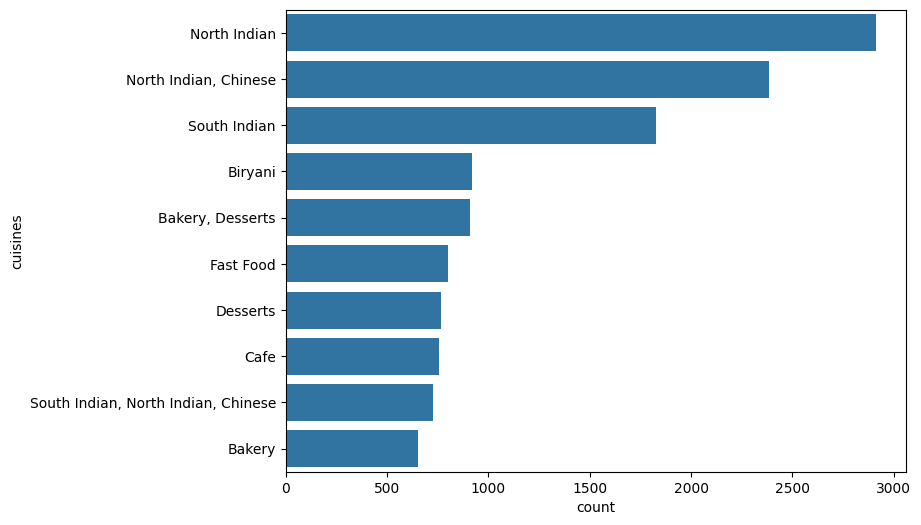

In [22]:
plt.figure(figsize=(8,6))
sns.barplot(x=cuisine_count, y=cuisine_count.index)
plt.show()

In [23]:
df['dish_liked']=df['dish_liked'].apply(lambda x : x.split(',') if type(x)==str else [''])

In [24]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"[Pasta, Lunch Buffet, Masala Papad, Paneer ...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"[Momos, Lunch Buffet, Chocolate Nirvana, Th...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","[Churros, Cannelloni, Minestrone Soup, Hot ...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,[Masala Dosa],"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"[Panipuri, Gol Gappe]","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


## WordCloud of Popular foods in top restaurant chains

In [25]:
from wordcloud import WordCloud

In [26]:
rest=df['rest_type'].value_counts()[:9].index
def produce_wordcloud(rest):
    plt.figure(figsize=(20,30))
    for i, r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=df[df['rest_type']==r]['dish_liked'].values.tolist()
        corpus=','.join(x for list_words in corpus for x in list_words)
        wordcloud=WordCloud(background_color='white', collocations=False,
                           width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis('off')

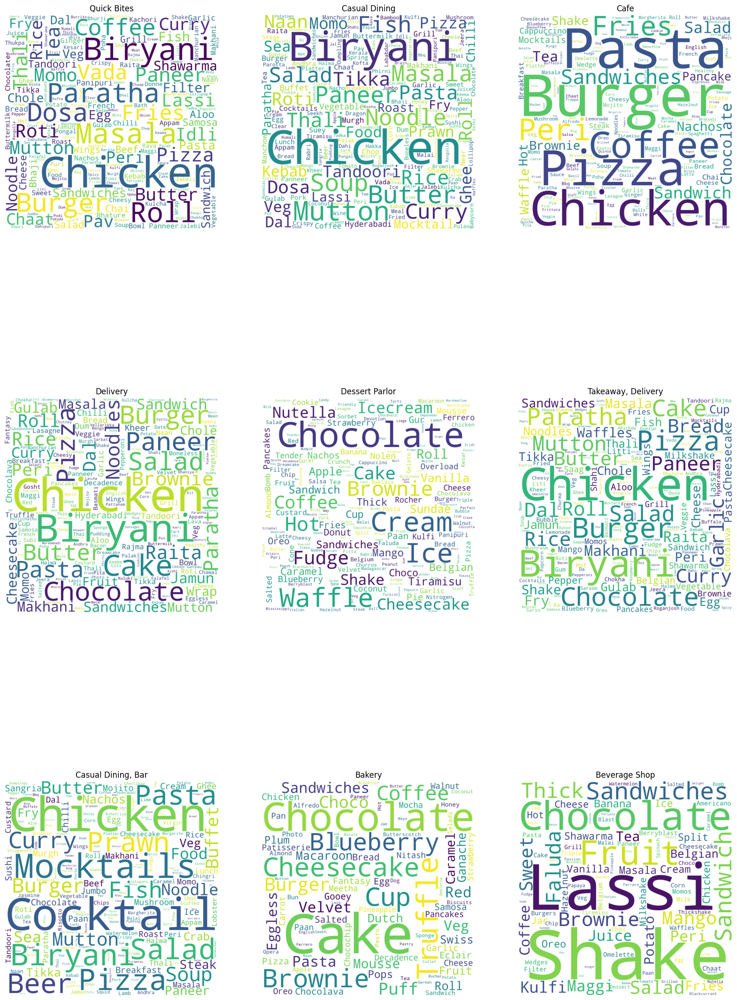

In [27]:
produce_wordcloud(rest)

## Rating distribution

In [28]:
reviews = df['reviews_list'][0]

In [29]:
reviews

'[(\'Rated 4.0\', \'RATED\\n  A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.\'), (\'Rated 4.0\', \'RATED\\n  I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout.\\nCheers\'), (\'Rated 2.0\', \'RATED\\n  Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said this plac

In [30]:
#  using the tqdm library to display a progress bar while iterating over a DataFrame (df) containing a column named
# 'name' and another column named 'reviews_list'.
#  The zip function is being used to iterate over pairs of values from these two columns simultaneously.
from tqdm import tqdm
all_ratings = []
for name, ratings in tqdm(zip(df['name'], df['reviews_list'])):
    ratings = eval(ratings)
    for score, doc in ratings:
        if score:
            score=score.strip('Rated').strip()
            doc=doc.strip('RATED').strip()
            score=float(score)
            all_ratings.append([name, score, doc])

51717it [00:16, 3106.72it/s]


In [31]:
all_ratings

[['Jalsa',
  4.0,
  'A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.'],
 ['Jalsa',
  4.0,
  'I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout.\nCheers'],
 ['Jalsa',
  2.0,
  'Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said this place is mostly visited by veg

In [32]:
import re
rating_df=pd.DataFrame(all_ratings, columns=['name', 'rating', 'review'])
rating_df['review']=rating_df['review'].apply(lambda x: re.sub('[^a-zA-Z0-9\s]',"",x))

In [33]:
rating_df.to_csv("Ratings.csv")

In [34]:
rating_df.head()

,name,rating,review
0,Jalsa,4.0,A beautiful place to dine inThe interiors take...
1,Jalsa,4.0,I was here for dinner with my family on a week...
2,Jalsa,2.0,Its a restaurant near to Banashankari BDA Me a...
3,Jalsa,4.0,We went here on a weekend and one of us had th...
4,Jalsa,5.0,The best thing about the place is its ambiance...


## Wordcloud of word mostly used in reviews in top restaurant chains

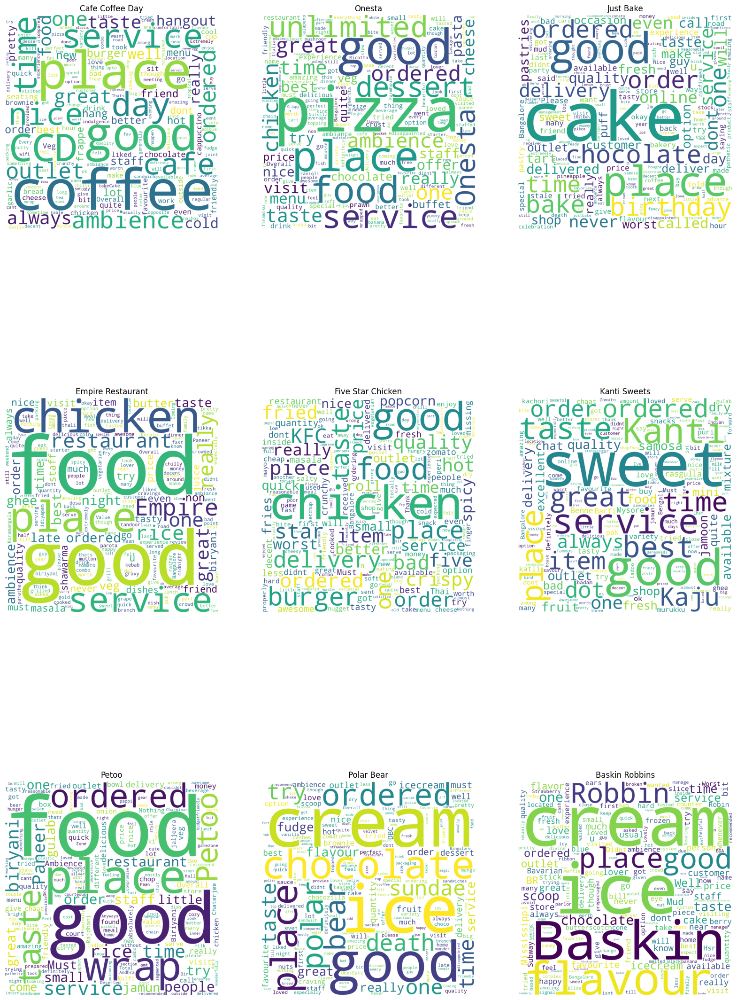

In [35]:
rest=df['name'].value_counts()[:9].index
def used_words(rest):
    plt.figure(figsize=(20,30))
    for i, n in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=rating_df[rating_df['name']==n]['review'].values.tolist()
        corpus=' '.join(x for x in corpus)
        wordCloud = WordCloud(background_color='white', collocations=False, width=1500, height=1500).generate(corpus)
        plt.imshow(wordCloud)
        plt.title(n)
        plt.axis('off')

used_words(rest)

    

In [68]:
#Deleting Unnnecessary Columns
df=df.drop(['url','dish_liked','phone'],axis=1) 

In [69]:
df.head()

,address,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [70]:
df.isnull().sum()
df.dropna(how='any',inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36739 entries, 0 to 51711
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   address                      36739 non-null  object 
 1   name                         36739 non-null  object 
 2   online_order                 36739 non-null  object 
 3   book_table                   36739 non-null  object 
 4   rate                         36739 non-null  object 
 5   votes                        36739 non-null  int64  
 6   location                     36739 non-null  object 
 7   rest_type                    36739 non-null  object 
 8   cuisines                     36739 non-null  object 
 9   approx_cost(for two people)  36739 non-null  float64
 10  reviews_list                 36739 non-null  object 
 11  menu_item                    36739 non-null  object 
 12  listed_in(type)              36739 non-null  object 
 13  listed_in(city)      

## Changing the Columns Names

In [71]:
df.columns
df = df.rename(columns={'approx_cost(for two people)':'cost','listed_in(type)':'type',
                                  'listed_in(city)':'city'})
df.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'location', 'rest_type', 'cuisines', 'cost', 'reviews_list',
       'menu_item', 'type', 'city'],
      dtype='object')

In [72]:
df.head()

,address,name,online_order,book_table,rate,votes,location,rest_type,cuisines,cost,reviews_list,menu_item,type,city
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


## Some Transformations


In [73]:
df['cost'] = df['cost'].astype(str)
df['cost'] = df['cost'].apply(lambda x: x.replace(',','.'))
df['cost'] = df['cost'].astype(float)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36739 entries, 0 to 51711
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   address       36739 non-null  object 
 1   name          36739 non-null  object 
 2   online_order  36739 non-null  object 
 3   book_table    36739 non-null  object 
 4   rate          36739 non-null  object 
 5   votes         36739 non-null  int64  
 6   location      36739 non-null  object 
 7   rest_type     36739 non-null  object 
 8   cuisines      36739 non-null  object 
 9   cost          36739 non-null  float64
 10  reviews_list  36739 non-null  object 
 11  menu_item     36739 non-null  object 
 12  type          36739 non-null  object 
 13  city          36739 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 4.2+ MB


In [74]:
df.head()

,address,name,online_order,book_table,rate,votes,location,rest_type,cuisines,cost,reviews_list,menu_item,type,city
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [103]:
df['rest_type'].value_counts()

rest_type
Quick Bites              13873
Casual Dining             7337
Cafe                      3158
Dessert Parlor            1842
Delivery                  1664
                         ...  
Dessert Parlor, Kiosk        2
Bakery, Food Court           2
Quick Bites, Kiosk           1
Bakery, Beverage Shop        1
Lounge                       1
Name: count, Length: 64, dtype: int64

In [105]:
rest_type_column = df['rest_type']

# Initialize an empty set to store unique words
unique_words = set()

# Split the text in each row into words and add them to the set of unique words
for rest_type in rest_type_column:
    words = rest_type.split()  # Split the text into words
    unique_words.update(words)  # Add the words to the set of unique words

# Get the total number of unique words
total_unique_words = len(unique_words)
total_unique_words

36

In [106]:
location_column = df['location']

# Initialize an empty set to store unique words
unique_words = set()

# Split the text in each row into words and add them to the set of unique words
for locations in location_column:
    words = locations.split()  # Split the text into words
    unique_words.update(words)  # Add the words to the set of unique words

# Get the total number of unique words
total_unique_words = len(unique_words)
total_unique_words

110

## Removing '/5' from Rates


In [80]:
df.head()

,address,name,online_order,book_table,rate,votes,location,rest_type,cuisines,cost,reviews_list,menu_item,type,city
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [92]:
df.dtypes

address          object
name             object
online_order       bool
book_table         bool
rate            float64
votes             int64
location         object
rest_type        object
cuisines         object
cost            float64
reviews_list     object
menu_item        object
type             object
city             object
dtype: object

In [81]:
# Adjust the column names
df.name = df.name.apply(lambda x:x.title())
df.online_order.replace(('Yes','No'),(True, False),inplace=True)
df.book_table.replace(('Yes','No'),(True, False),inplace=True)
df.cost.unique()

array([800., 300., 600., 700., 550., 500., 450., 650., 400., 900., 200.,
       750., 150., 850., 100., 350., 250., 950., 199., 230., 130., 180.,
       330.,  50.,  40.,  70., 240., 120.,  80.])

In [82]:
#Encode the input Variables
def Encode(df):
    for column in df.columns[~df.columns.isin(['rate', 'cost', 'votes'])]:
        df[column] = df[column].factorize()[0]
    return df

zomato_en = Encode(df.copy())

In [96]:
#Defining the independent variables and dependent variables
x = zomato_en.iloc[:,[2,3,5,6,7,8,9]]
y = zomato_en['rate']
#Getting Test and Training Set
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.1,random_state=353)
x_train.head()
y_train.head()

22168    4.1
18405    4.1
19179    4.2
33919    3.6
16037    3.6
Name: rate, dtype: float64

In [97]:
x

,online_order,book_table,votes,location,rest_type,cuisines,cost
0,0,0,775,0,0,0,800.0
1,0,1,787,0,0,1,800.0
2,0,1,918,0,1,2,800.0
3,1,1,88,0,2,3,300.0
4,1,1,166,1,0,4,600.0
...,...,...,...,...,...,...,...
34608,0,1,49,55,2,49,300.0
34609,1,1,34,25,28,195,800.0
34610,1,1,81,25,28,671,800.0
34611,1,1,34,25,28,195,800.0


# Regression Analysis

## Linear Regression

In [98]:
from sklearn.linear_model import LinearRegression
reg=LinearRegression()
reg.fit(x_train,y_train)
y_pred=reg.predict(x_test)
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.18372677849776142

## Decision Tree Regression

In [99]:
#Prepairng a Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.1,random_state=105)
DTree=DecisionTreeRegressor(min_samples_leaf=.0001)
DTree.fit(x_train,y_train)
y_predict=DTree.predict(x_test)
from sklearn.metrics import r2_score
r2_score(y_test,y_predict)

0.8175885148002531

## Random Forest Regression

In [100]:
from sklearn.ensemble import RandomForestRegressor
RForest=RandomForestRegressor(n_estimators=500,random_state=329,min_samples_leaf=.0001)
RForest.fit(x_train,y_train)
y_predict=RForest.predict(x_test)
from sklearn.metrics import r2_score
r2_score(y_test,y_predict)

0.8526398334425541

## Extra Tree Regression¶

In [101]:
from sklearn.ensemble import  ExtraTreesRegressor
ETree=ExtraTreesRegressor(n_estimators = 100)
ETree.fit(x_train,y_train)
y_predict=ETree.predict(x_test)
from sklearn.metrics import r2_score
r2_score(y_test,y_predict)

0.9427032724701274

In [102]:
import pickle
pickle.dump(ETree, open('model.pkl','wb'))   